In [192]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

# uploader le fichier du dataset principal en csv
datatrain = pd.read_csv('datatrain_cleanedV2.csv')
#print(datatrain.columns.tolist())
#print(datatrain.shape)
datatrain.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,REGION_RATING_CLIENT_W_CITY,YEARS_BEGINEXPLUATATION_MODE,LIVINGAPARTMENTS_MODE,FLAG_DOC_MERGE,CUMUL_APART_EXT_OPT,...,ANNUITY INCOME RATIO %,NUMBER OF YEARS (LOAN/ANNUITY),CNT_CREDIT_PROLONG,CREDIT_SUM_OVERDUE INCOME RATIO %,CREDIT_MAX_OVERDUE INCOME RATIO %,CNT_DRAWINGS_CURRENT,SK_DPD,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT
0,100002,1,1,1.0,202500.0,2,0.9722,0.022000,1,0.047143,...,12.197778,16.461104,0,0.0,4.150689,17.0,0,2.0,19,53093.745
1,100007,0,1,1.0,121500.0,2,0.9618,0.109846,1,0.117691,...,17.996296,23.461618,0,0.0,0.000000,10.0,0,2.0,17,22678.785
2,100008,0,1,1.0,99000.0,2,0.9618,0.109846,1,0.117691,...,27.795455,17.824857,0,0.0,0.000000,10.0,0,2.0,10,432218.295
3,100009,0,1,1.0,171000.0,2,0.9618,0.109846,1,0.117691,...,24.152632,37.789061,0,0.0,0.000000,12.0,0,1.0,12,17341.605
4,100014,0,1,1.0,112500.0,2,0.9618,0.109846,1,0.117691,...,18.824000,30.811730,0,0.0,19.873880,1.0,0,1.0,12,14045.625


In [193]:
#datatrain_short = datatrain[:20000]
datatrain_short = datatrain

In [14]:
#MinMaxScaler before checking correlation
X_forcorr = datatrain_short.drop(['SK_ID_CURR'], axis=1)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_mms = X_forcorr
X_mms[X_mms.columns] = scaler.fit_transform(X_mms[X_mms.columns])
X_mms.head()

,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,REGION_RATING_CLIENT_W_CITY,YEARS_BEGINEXPLUATATION_MODE,LIVINGAPARTMENTS_MODE,FLAG_DOC_MERGE,CUMUL_APART_EXT_OPT,EDUC_INC_TYPE,...,ANNUITY INCOME RATIO %,NUMBER OF YEARS (LOAN/ANNUITY),CNT_CREDIT_PROLONG,CREDIT_SUM_OVERDUE INCOME RATIO %,CREDIT_MAX_OVERDUE INCOME RATIO %,CNT_DRAWINGS_CURRENT,SK_DPD,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT
0,1.0,1.0,1.0,0.565847,0.5,0.290816,0.022000,1.0,0.061467,0.5,...,0.109005,0.267209,0.0,0.0,0.000567,0.134921,0.0,0.043478,0.076271,0.015746
1,0.0,1.0,1.0,0.305355,0.5,0.025510,0.109846,1.0,0.153452,0.5,...,0.166555,0.489253,0.0,0.0,0.000000,0.079365,0.0,0.043478,0.067797,0.006726
2,0.0,1.0,1.0,0.232996,0.5,0.025510,0.109846,1.0,0.153452,0.5,...,0.263813,0.310465,0.0,0.0,0.000000,0.079365,0.0,0.043478,0.038136,0.128183
3,0.0,1.0,1.0,0.464544,0.5,0.025510,0.109846,1.0,0.153452,1.0,...,0.227658,0.943696,0.0,0.0,0.000000,0.095238,0.0,0.021739,0.046610,0.005143
4,0.0,1.0,1.0,0.276411,0.5,0.025510,0.109846,1.0,0.153452,1.0,...,0.174770,0.722386,0.0,0.0,0.002713,0.007937,0.0,0.021739,0.046610,0.004165


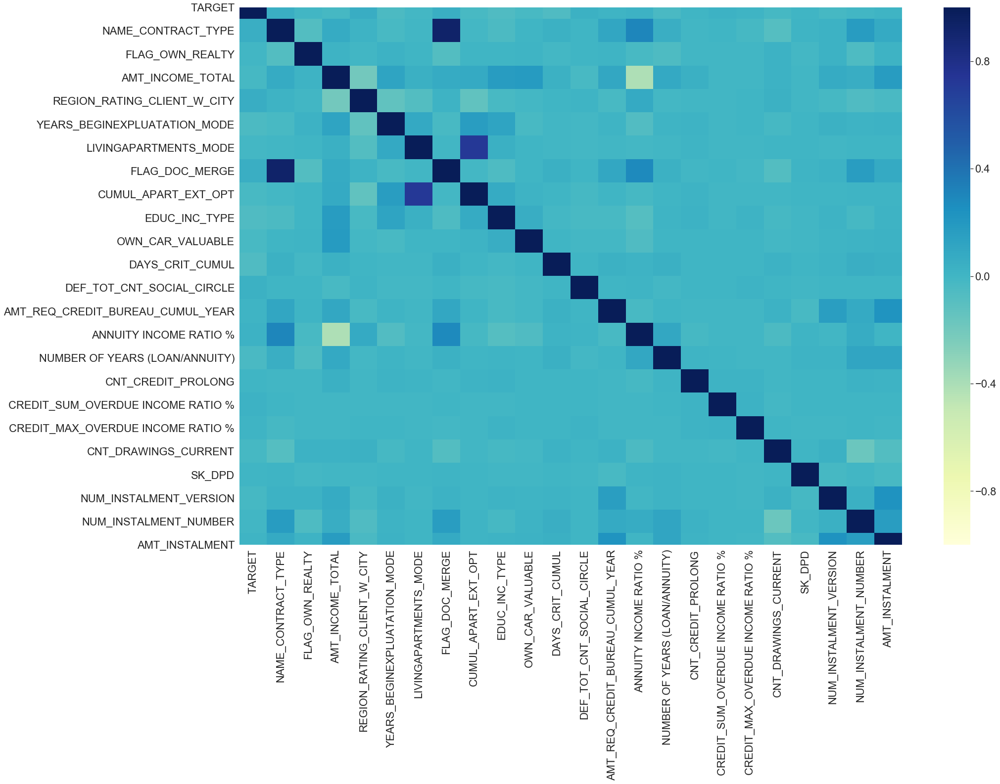

In [8]:
#Etude des correlations sur le dataframe normalisé excluant les objets 
# que faire pour voir toutes les correlations?
corr_X_mms = X_mms.corr()
plt.figure(figsize=(30, 20))
sns.set(font_scale=2)
#ax = sns.heatmap(corr_X_mms, cmap="YlGnBu")
ax = sns.heatmap(corr_X_mms, vmin=-1, vmax=1, cmap="YlGnBu")

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  22 out of  22 | elapsed:  7.8min finished

[2020-05-20 00:49:54] Features: 1/11 -- score: 0.5898655854644693[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed: 14.3min finished

[2020-05-20 01:04:14] Features: 2/11 -- score: 0.5940399741545394[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed: 15.1min finished

[2020-05-20 01:19:19] Features: 3/11 -- score: 0.5957101714324119[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed: 17.2min finished

[2020-05-20 01:36:33] Features: 4/11 -- score: 0.6020722496030718[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed: 19.1min finished



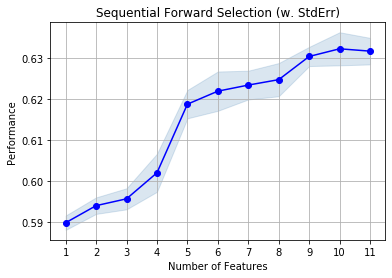

10 features selected: ['NAME_CONTRACT_TYPE', 'REGION_RATING_CLIENT_W_CITY', 'CUMUL_APART_EXT_OPT', 'EDUC_INC_TYPE', 'DAYS_CRIT_CUMUL', 'NUMBER OF YEARS (LOAN/ANNUITY)', 'CNT_DRAWINGS_CURRENT', 'SK_DPD', 'NUM_INSTALMENT_NUMBER', 'AMT_INSTALMENT']


In [17]:
# Feature selections to reduce the dimension of the problem
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing


X_forSFS = datatrain_short.drop(['SK_ID_CURR','TARGET','FLAG_DOC_MERGE'], axis=1)
y_forSFS = datatrain_short['TARGET']

# the number of features selected should not be higher than half of the total number of features
max_num_feat = int(np.ceil(X_forSFS.shape[1]/2))

#std_scale = preprocessing.StandardScaler().fit(X_forSFS)
#X_forSFS_scaled = std_scale.transform(X_forSFS)
std_scale = preprocessing.StandardScaler()
X_forSFS_scaled = X_forSFS
X_forSFS_scaled[X_forSFS_scaled.columns] = std_scale.fit_transform(X_forSFS_scaled[X_forSFS_scaled.columns])

#a RandomForestRegressor model with 100 iterations
lr_sfs = RandomForestClassifier(n_estimators=100, random_state = 42, n_jobs = -1)
sfs_lr_fs = SFS(lr_sfs, k_features=(2,max_num_feat), forward=True, floating=False, verbose=2,scoring='roc_auc',cv=6,n_jobs=-1)
# 

#sfs_lr_fs = sfs_lr_fs.fit(X_forSFS_train, y_forSFS_train)
sfs_lr_fs = sfs_lr_fs.fit(X_forSFS_scaled, y_forSFS)
#X_mms_forSFS.describe()
fig = plot_sfs(sfs_lr_fs.get_metric_dict(), kind='std_err')
#plt.ylim([-500, 0])
plt.title('Sequential Forward Selection (w. StdErr)')
plt.grid()
plt.show()

X_forSFS_fs_subset = sfs_lr_fs.transform(X_forSFS_scaled)
df_sfs_fs_subset = pd.DataFrame(X_forSFS_fs_subset)
df_sfs_fs_subset.columns = sfs_lr_fs.k_feature_names_
print('{} features selected: {}'.format(df_sfs_fs_subset.shape[1],df_sfs_fs_subset.columns.tolist()))

In [194]:
X = datatrain_short.drop(['SK_ID_CURR','TARGET','FLAG_DOC_MERGE'], axis=1)
y = datatrain_short['TARGET']
# hypothese les donnes sont centrees
from sklearn import preprocessing
#std_scale = preprocessing.StandardScaler().fit(X)
#X_scaled = std_scale.transform(X)
X_scaled = X.copy()
std_scale = preprocessing.StandardScaler()
X_scaled[X_scaled.columns] = std_scale.fit_transform(X_scaled[X_scaled.columns])

In [195]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [196]:
# calcul de la forêt aléatoire optimal
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV # for hyperparameters tuning
# Hyperparameter values to feed to the RandomizedSearchCV
param_grid = {'max_features': ['auto', 'sqrt'], # Number of features to consider at every split
               'max_depth': [5, 7], # Maximum number of levels in tree
               'min_samples_split': [5, 7], # Minimum number of samples required to split a node
               'min_samples_leaf': [2, 4], # Minimum number of samples required at each leaf node
               }
ranfor_cl1 = RandomizedSearchCV(RandomForestClassifier(n_estimators=100), param_distributions = param_grid, n_iter = 100, verbose = 2, n_jobs = -1,cv=6)


In [197]:
ranfor_cl1.fit(X_train, y_train)

C:\Users\USER\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:281: UserWarning: The total space of parameters 16 is smaller than n_iter=100. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 6 folds for each of 16 candidates, totalling 96 fits


[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  96 out of  96 | elapsed:  6.3min finished


RandomizedSearchCV(cv=6, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [198]:
# Check the best parameters found by RandomizedSearchCV
print(ranfor_cl1.best_params_)
ranfor_cl1_opt = RandomForestClassifier(n_estimators=100,
                                        max_depth = ranfor_cl1.best_params_['max_depth'],
                                        min_samples_split=ranfor_cl1.best_params_['min_samples_split'],
                                        min_samples_leaf=ranfor_cl1.best_params_['min_samples_leaf'],
                                        max_features=ranfor_cl1.best_params_['max_features'])
ranfor_cl1_opt.fit(X_train, y_train)

{'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 5}


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=5, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [215]:
y_pred_proba = ranfor_cl1_opt.predict_proba(X_train)[:, 1]
y_pred_proba

array([0.1187867 , 0.07066669, 0.09033659, ..., 0.09444791, 0.08103588,
       0.12817416])

In [317]:
from sklearn.metrics import confusion_matrix

def score_eval(y_true,y_pred_prob):
    col_df_score_eval = (['Threshold', 'weighted TN', 'weighted FP', 'weighted FN', 'weighted TP', 'weighted Recall', 
                          'weighted precision', 'weighted F-score','Score'])
    df_score_eval= pd.DataFrame(columns = col_df_score_eval)
    list_thr = np.linspace(0.01, 0.15, num=15).tolist()
    # customed points FN = -3, FP = -1, TP = 1, TN=2 
    # Finding client who are able to pay is important TN=2 
    #  Giving loan to client who will fail is most important FN = -3
    wfn = -3
    wfp = -1
    wtp = 1
    wtn = 2
    for ithr in list_thr:
        y_pred_with_thr_temp = y_pred_prob > ithr
        tn_temp, fp_temp, fn_temp, tp_temp = confusion_matrix(y_true, y_pred_with_thr_temp).ravel()
        weighted_recall_temp = wtp*tp_temp/(wtp*tp_temp+wfn*fn_temp)
        weighted_precision_temp = wtp*tp_temp/(wtp*tp_temp+wfp*fp_temp)
        weidhted_f_score_temp = 2*(weighted_precision_temp*weighted_recall_temp)/(weighted_precision_temp+weighted_recall_temp)
#        score_cus = ( wtn*tn_temp+ wfp*fp_temp+ wfn*fn_temp + wtp*tp_temp)/(tn_temp + fp_temp + fn_temp + tp_temp)
        score_cus = ( wtn*tn_temp+ wfp*fp_temp+ wfn*fn_temp + wtp*tp_temp)/(tn_temp - fp_temp - fn_temp + tp_temp)
        list_score_temp = ([ithr, wtn*tn_temp, wfp*fp_temp, wfn*fn_temp, wtp*tp_temp,
                            weighted_recall_temp, weighted_precision_temp, weidhted_f_score_temp, score_cus])
        df_score_eval = df_score_eval.append(pd.DataFrame(np.asarray(list_score_temp).reshape(1, -1),columns = col_df_score_eval))
        del tn_temp, fp_temp, fn_temp, tp_temp
        del y_pred_with_thr_temp
    return df_score_eval
df_score_eval_rand_for = score_eval(y_train,y_pred_proba)

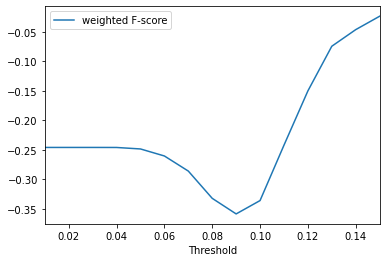

In [294]:
#train
df_score_eval_rand_for.plot(x ='Threshold', y='weighted F-score', kind = 'line')
plt.show()

This below is the customized score, the value selected for the threshold is before the minimum score (False negative starts to be important in number) and maximum score (True Negative starts to be important in number)
So here the threshold for the train set is 0.07

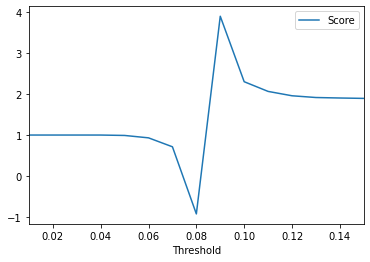

In [318]:
df_score_eval_rand_for.plot(x ='Threshold', y='Score', kind = 'line')
plt.show()

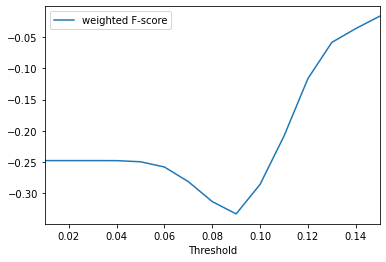

In [319]:
y_pred_proba_test = ranfor_cl1_opt.predict_proba(X_test)[:, 1]
df_score_eval_rand_for_test = score_eval(y_test,y_pred_proba_test)
df_score_eval_rand_for_test.plot(x ='Threshold', y='weighted F-score', kind = 'line')
plt.show()

The threshold for the train set is 0.07 and the score is 0.73 (the ideal score is 0 when the all weighted TN, TP, FN, FP compensate each others)

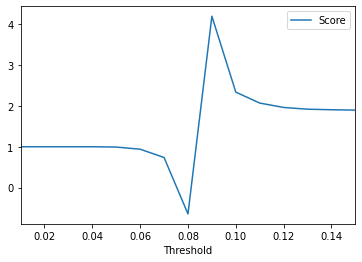

In [320]:
df_score_eval_rand_for_test.plot(x ='Threshold', y='Score', kind = 'line')
plt.show()

In [335]:
df_score_eval_rand_for_test

,Threshold,weighted TN,weighted FP,weighted FN,weighted TP,weighted Recall,weighted precision,weighted F-score,Score
0,0.01,0.0,-12472.0,0.0,1238.0,1.000000,-0.110201,-0.247699,1.000000
0,0.02,0.0,-12472.0,0.0,1238.0,1.000000,-0.110201,-0.247699,1.000000
0,0.03,0.0,-12472.0,0.0,1238.0,1.000000,-0.110201,-0.247699,1.000000
0,0.04,6.0,-12469.0,0.0,1238.0,1.000000,-0.110231,-0.247773,0.999733
0,0.05,178.0,-12383.0,-3.0,1237.0,1.002431,-0.110982,-0.249596,0.992132
0,0.06,1280.0,-11832.0,-57.0,1219.0,1.049053,-0.114859,-0.257962,0.939752
0,0.07,4116.0,-10414.0,-213.0,1167.0,1.223270,-0.126203,-0.281442,0.736088
0,0.08,9152.0,-7896.0,-654.0,1020.0,2.786885,-0.148342,-0.313364,-0.644162
0,0.09,13974.0,-5485.0,-1206.0,836.0,-2.259459,-0.179824,-0.333134,4.193698
0,0.10,18480.0,-3232.0,-1977.0,579.0,-0.414163,-0.218243,-0.285855,2.336370


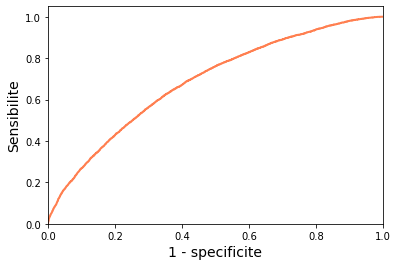

AUROC:0.6865561355415533
Sensibilité : 0.95
Spécificité : 0.17
Seuil : 0.07


In [13]:
#calcul de l'AUROC
from sklearn import metrics
#from sklearn.metrics import roc_curve, auc
#from sklearn.metrics import roc_auc_score

[fpr, tpr, thr] = metrics.roc_curve(y_train.ravel(), y_pred_proba.ravel())
plt.plot(fpr, tpr, color='coral', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1 - specificite', fontsize=14)
plt.ylabel('Sensibilite', fontsize=14)
plt.show()

print('AUROC:{}'.format(metrics.auc(fpr, tpr)))
# indice du premier seuil pour lequel
# la sensibilité est supérieure à 0.95
idx = np.min(np.where(tpr > 0.95)) 

print("Sensibilité : {:.2f}".format(tpr[idx]))
print("Spécificité : {:.2f}".format(1-fpr[idx]))
print("Seuil : {:.2f}".format(thr[idx]))

In [12]:
import pickle
# Saving model to disk
pickle.dump(ranfor_cl1_opt, open('randfor_cl1_test.pkl','wb'))

In [296]:
# calcul du modèle xgboost optimal avec 23 features
import xgboost as xgb
from xgboost import XGBClassifier
# Hyperparameter values to feed to the RandomizedSearchCV
param_grid_xgboo = {"learning_rate"   : [0.05, 0.1, 0.15],
             'max_depth'        : [5, 7],
             "min_child_weight" : [3, 5],
             "gamma"            : [0.0, 0.05, 0.1],
             "colsample_bytree" : [0.4, 0.5, 0.6]
             }
xgboo_cl1 = RandomizedSearchCV(XGBClassifier(), param_distributions = param_grid_xgboo, n_iter = 100, scoring = 'roc_auc', verbose = 2, n_jobs = -1, cv=6)

xgboo_cl1.fit(X_train, y_train)

Fitting 6 folds for each of 100 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 33.7min
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed: 55.7min finished


RandomizedSearchCV(cv=6, error_score=nan,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_alpha=0,
                                           reg_lambda=1, sc...ght=1,
                                           seed=None, silent=None, subsample=1,
                                           verbosity=1),
                   iid='deprecated

In [297]:
print(xgboo_cl1.best_params_)
xgboo_cl1_opt = XGBClassifier(min_child_weight=xgboo_cl1.best_params_['min_child_weight'],
                              max_depth=xgboo_cl1.best_params_['max_depth'],
                              learning_rate=xgboo_cl1.best_params_['learning_rate'],
                              gamma=xgboo_cl1.best_params_['gamma'],
                              colsample_bytree=xgboo_cl1.best_params_['colsample_bytree'])
xgboo_cl1_opt.fit(X_train, y_train)

{'min_child_weight': 3, 'max_depth': 5, 'learning_rate': 0.15, 'gamma': 0.05, 'colsample_bytree': 0.6}


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6, gamma=0.05,
              learning_rate=0.15, max_delta_step=0, max_depth=5,
              min_child_weight=3, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

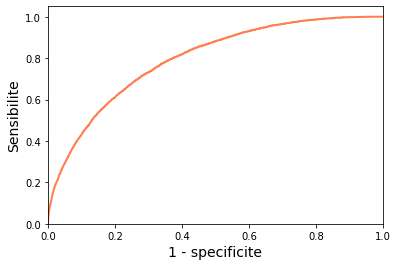

AUROC:0.7942884043715865
Sensibilité : 0.95
Spécificité : 0.35
Seuil : 0.05


In [28]:
#Cacul de l'AUROC pour le test set
y_xgboo_pred_proba = xgboo_cl1_opt.predict_proba(X_train)[:, 1]

from sklearn import metrics
#from sklearn.metrics import roc_curve, auc
#from sklearn.metrics import roc_auc_score

[fpr, tpr, thr] = metrics.roc_curve(y_train.ravel(), y_xgboo_pred_proba.ravel())
plt.plot(fpr, tpr, color='coral', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1 - specificite', fontsize=14)
plt.ylabel('Sensibilite', fontsize=14)
plt.show()

print('AUROC:{}'.format(metrics.auc(fpr, tpr)))
# indice du premier seuil pour lequel
# la sensibilité est supérieure à 0.95
idx = np.min(np.where(tpr > 0.95)) 

print("Sensibilité : {:.2f}".format(tpr[idx]))
print("Spécificité : {:.2f}".format(1-fpr[idx]))
print("Seuil : {:.2f}".format(thr[idx]))

In [298]:
import pickle
# Saving model to disk
pickle.dump(xgboo_cl1_opt, open('xgboo_cl1_opt.pkl','wb'))

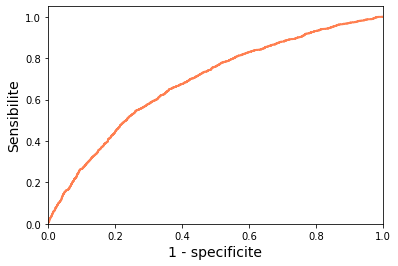

AUROC:0.6854930812386465
Sensibilité : 0.95
Spécificité : 0.15
Seuil : 0.04


In [30]:
#Cacul de l'AUROC pour le test set
y_xgboo_pred_proba_test = xgboo_cl1_opt.predict_proba(X_test)[:, 1]

from sklearn import metrics
#from sklearn.metrics import roc_curve, auc
#from sklearn.metrics import roc_auc_score

[fpr, tpr, thr] = metrics.roc_curve(y_test.ravel(), y_xgboo_pred_proba_test.ravel())
plt.plot(fpr, tpr, color='coral', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1 - specificite', fontsize=14)
plt.ylabel('Sensibilite', fontsize=14)
plt.show()

print('AUROC:{}'.format(metrics.auc(fpr, tpr)))
# indice du premier seuil pour lequel
# la sensibilité est supérieure à 0.95
idx = np.min(np.where(tpr > 0.95)) 

print("Sensibilité : {:.2f}".format(tpr[idx]))
print("Spécificité : {:.2f}".format(1-fpr[idx]))
print("Seuil : {:.2f}".format(thr[idx]))

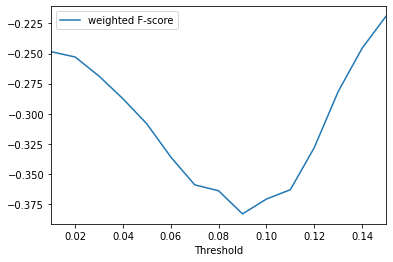

In [321]:
# weighted F-score, test set
y_xgboo_pred_proba_test = xgboo_cl1_opt.predict_proba(X_test)[:, 1]
df_score_eval_xgb23 = score_eval(y_test,y_xgboo_pred_proba_test)
df_score_eval_xgb23.plot(x ='Threshold', y='weighted F-score', kind = 'line')
plt.show()

Here the threshold for the test set is 0.05 (value of the threshold before the 2 score extrema)

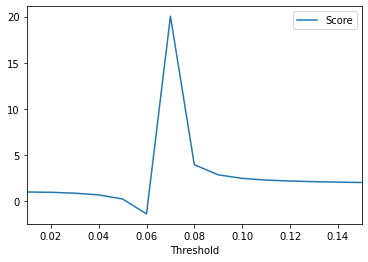

In [322]:
# Score, test set
df_score_eval_xgb23.plot(x ='Threshold', y='Score', kind = 'line')
plt.show()

the score value for the threshold at 0.05 is 0.24

In [301]:
list1 = ['NAME_CONTRACT_TYPE', 'REGION_RATING_CLIENT_W_CITY', 'CUMUL_APART_EXT_OPT', 'EDUC_INC_TYPE', 'DAYS_CRIT_CUMUL', 'NUMBER OF YEARS (LOAN/ANNUITY)', 'CNT_DRAWINGS_CURRENT', 'SK_DPD', 'NUM_INSTALMENT_NUMBER', 'AMT_INSTALMENT']
list2 = datatrain_short.columns.tolist()
list2_1 = [xl for xl in list2 if xl not in list1]
X_red = datatrain_short.drop(list2_1, axis=1)

In [302]:
X_red.describe()

,NAME_CONTRACT_TYPE,REGION_RATING_CLIENT_W_CITY,CUMUL_APART_EXT_OPT,EDUC_INC_TYPE,DAYS_CRIT_CUMUL,NUMBER OF YEARS (LOAN/ANNUITY),CNT_DRAWINGS_CURRENT,SK_DPD,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT
count,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.00000,6.854700e+04
mean,0.862955,2.062278,0.116360,1.230397,0.569099,20.965671,7.471954,9.472304,28.46517,1.433188e+05
std,0.343897,0.488557,0.042995,0.442477,0.495206,7.349792,9.160138,140.716631,31.76696,2.421828e+05
min,0.000000,1.000000,0.000000,0.000000,0.000000,8.036674,0.000000,0.000000,1.00000,7.650000e-01
25%,1.000000,2.000000,0.100893,1.000000,0.000000,15.496605,0.000000,0.000000,10.00000,1.573799e+04
50%,1.000000,2.000000,0.117691,1.000000,1.000000,20.000000,5.000000,0.000000,15.00000,4.104275e+04
75%,1.000000,2.000000,0.117691,1.000000,1.000000,25.654680,11.000000,0.000000,28.00000,1.478398e+05
max,1.000000,3.000000,0.766957,2.000000,1.000000,39.564198,126.000000,4050.000000,237.00000,3.371884e+06


In [10]:
X_red_mean = pd.DataFrame(data= X_red.mean().values.reshape(1, -1), columns = X_red.mean().index)
X_red_std = pd.DataFrame(data= X_red.std().values.reshape(1, -1), columns = X_red.std().index)
X_red_std

,NAME_CONTRACT_TYPE,REGION_RATING_CLIENT_W_CITY,CUMUL_APART_EXT_OPT,EDUC_INC_TYPE,DAYS_CRIT_CUMUL,NUMBER OF YEARS (LOAN/ANNUITY),CNT_DRAWINGS_CURRENT,SK_DPD,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT
0,0.343897,0.488557,0.042995,0.442477,0.495206,7.349792,9.160138,140.716631,31.76696,242182.772677


In [303]:
from sklearn import preprocessing
#std_scale_red = preprocessing.StandardScaler().fit(X_red)
#X_red_scaled = std_scale_red.transform(X_red)
std_scale_red = preprocessing.StandardScaler()
X_red_scaled = X_red.copy()
X_red_scaled[X_red_scaled.columns] = std_scale_red.fit_transform(X_red_scaled[X_red_scaled.columns])
X_red_scaled

,NAME_CONTRACT_TYPE,REGION_RATING_CLIENT_W_CITY,CUMUL_APART_EXT_OPT,EDUC_INC_TYPE,DAYS_CRIT_CUMUL,NUMBER OF YEARS (LOAN/ANNUITY),CNT_DRAWINGS_CURRENT,SK_DPD,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT
0,0.398508,-0.127475,-1.609883,-0.520701,-1.149224,-0.612888,1.040172,-0.067315,-0.297959,-0.372552
1,0.398508,-0.127475,0.030960,-0.520701,0.870152,0.339597,0.275985,-0.067315,-0.360918,-0.498140
2,0.398508,-0.127475,0.030960,-0.520701,0.870152,-0.427337,0.275985,-0.067315,-0.581274,1.192907
3,0.398508,-0.127475,0.030960,1.739319,0.870152,2.288978,0.494324,-0.067315,-0.518315,-0.520178
4,0.398508,-0.127475,0.030960,1.739319,-1.149224,1.339647,-0.706540,-0.067315,-0.518315,-0.533787
...,...,...,...,...,...,...,...,...,...,...
68542,0.398508,-2.174332,1.491212,1.739319,0.870152,-0.206802,0.275985,-0.067315,-0.549794,-0.372488
68543,0.398508,-0.127475,0.030960,1.739319,0.870152,-1.476848,1.149341,-0.067315,-0.329438,-0.529914
68544,0.398508,-0.127475,0.030960,1.739319,-1.149224,-0.207188,-0.815709,-0.067315,2.661112,-0.216073
68545,0.398508,-0.127475,-0.845918,-0.520701,0.870152,-0.360295,0.931002,-0.067315,-0.581274,-0.513058


In [304]:
from sklearn.model_selection import train_test_split
X_red_train, X_red_test, y_red_train, y_red_test = train_test_split(X_red_scaled, y, test_size=0.2, random_state=42)

In [306]:
# calcul du modèle xgboost optimal avec 10 features
xgboo_cl1_red = RandomizedSearchCV(XGBClassifier(), param_distributions = param_grid_xgboo, n_iter = 100, scoring = 'roc_auc', verbose = 2, n_jobs = -1, cv=6)

xgboo_cl1_red.fit(X_red_train, y_red_train)

Fitting 6 folds for each of 100 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed: 39.1min finished


RandomizedSearchCV(cv=6, error_score=nan,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1, gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_alpha=0,
                                           reg_lambda=1, sc...ght=1,
                                           seed=None, silent=None, subsample=1,
                                           verbosity=1),
                   iid='deprecated

In [307]:
print(xgboo_cl1_red.best_params_)
xgboo_cl1_red_opt = XGBClassifier(min_child_weight=xgboo_cl1_red.best_params_['min_child_weight'],
                              max_depth=xgboo_cl1_red.best_params_['max_depth'],
                              learning_rate=xgboo_cl1_red.best_params_['learning_rate'],
                              gamma=xgboo_cl1_red.best_params_['gamma'],
                              colsample_bytree=xgboo_cl1_red.best_params_['colsample_bytree'])
xgboo_cl1_red_opt.fit(X_red_train, y_red_train)

{'min_child_weight': 3, 'max_depth': 5, 'learning_rate': 0.15, 'gamma': 0.05, 'colsample_bytree': 0.6}


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6, gamma=0.05,
              learning_rate=0.15, max_delta_step=0, max_depth=5,
              min_child_weight=3, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

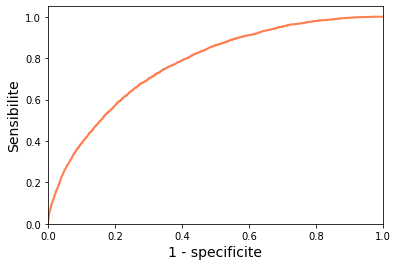

AUROC:0.7714822796042018
Sensibilité : 0.95
Spécificité : 0.31
Seuil : 0.05


In [47]:
# calcul de l'AUROC pour le train set
y_xgboo_red_pred_proba = xgboo_cl1_red_opt.predict_proba(X_red_train)[:, 1]

from sklearn import metrics
#from sklearn.metrics import roc_curve, auc
#from sklearn.metrics import roc_auc_score

[fpr, tpr, thr] = metrics.roc_curve(y_red_train.ravel(), y_xgboo_red_pred_proba.ravel())
plt.plot(fpr, tpr, color='coral', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1 - specificite', fontsize=14)
plt.ylabel('Sensibilite', fontsize=14)
plt.show()

print('AUROC:{}'.format(metrics.auc(fpr, tpr)))
# indice du premier seuil pour lequel
# la sensibilité est supérieure à 0.95
idx = np.min(np.where(tpr > 0.95)) 

print("Sensibilité : {:.2f}".format(tpr[idx]))
print("Spécificité : {:.2f}".format(1-fpr[idx]))
print("Seuil : {:.2f}".format(thr[idx]))

In [22]:
import pickle
# Saving model to disk
pickle.dump(xgboo_cl1_red_opt, open('xgboo_cl1_red_opt.pkl','wb'))

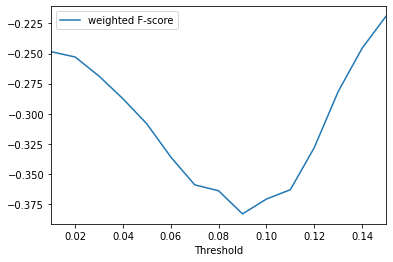

In [324]:
# weighted F-score, test set
y_xgboo_red_pred_proba_test = xgboo_cl1_red_opt.predict_proba(X_red_test)[:, 1]
df_score_eval_xgb10 = score_eval(y_test,y_xgboo_pred_proba_test)
df_score_eval_xgb10.plot(x ='Threshold', y='weighted F-score', kind = 'line')
plt.show()

Here the threshold for the test set is 0.05 (value of the threshold before the 2 score extrema), the corresponding score is 0.24.

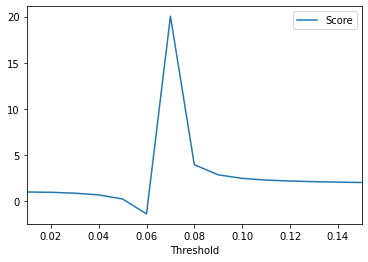

In [325]:
# Score, test set
df_score_eval_xgb10.plot(x ='Threshold', y='Score', kind = 'line')
plt.show()

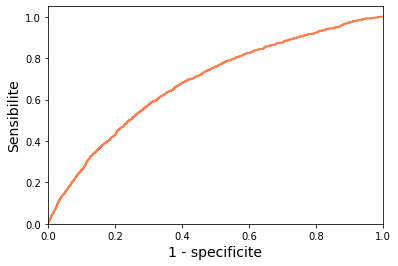

AUROC:0.6836131351027595
Sensibilité : 0.95
Spécificité : 0.13
Seuil : 0.04


In [50]:
# calcul de l'AUROC pour le test set
y_xgboo_red_pred_proba_test = xgboo_cl1_red_opt.predict_proba(X_red_test)[:, 1]

from sklearn import metrics
#from sklearn.metrics import roc_curve, auc
#from sklearn.metrics import roc_auc_score

[fpr, tpr, thr] = metrics.roc_curve(y_test.ravel(), y_xgboo_red_pred_proba_test.ravel())
plt.plot(fpr, tpr, color='coral', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('1 - specificite', fontsize=14)
plt.ylabel('Sensibilite', fontsize=14)
plt.show()

print('AUROC:{}'.format(metrics.auc(fpr, tpr)))
# indice du premier seuil pour lequel
# la sensibilité est supérieure à 0.95
idx = np.min(np.where(tpr > 0.95)) 

print("Sensibilité : {:.2f}".format(tpr[idx]))
print("Spécificité : {:.2f}".format(1-fpr[idx]))
print("Seuil : {:.2f}".format(thr[idx]))

In [21]:
df_coef_xgboo_cl = (pd.DataFrame({'Features':np.array(list(xgboo_cl1_red_opt.get_booster().get_score(importance_type='weight').keys())),
                                   'XGBoo_coef Dataframe 1':np.array(list(xgboo_cl1_red_opt.get_booster().get_score(importance_type='weight').values()))}))
df_coef_xgboo_cl.sort_values(by=['XGBoo_coef Dataframe 1'], ascending=False)

,Features,XGBoo_coef Dataframe 1
6,NUMBER OF YEARS (LOAN/ANNUITY),658
2,AMT_INSTALMENT,486
4,CUMUL_APART_EXT_OPT,319
9,NUM_INSTALMENT_NUMBER,268
3,CNT_DRAWINGS_CURRENT,214
5,SK_DPD,63
1,DAYS_CRIT_CUMUL,59
8,REGION_RATING_CLIENT_W_CITY,54
0,EDUC_INC_TYPE,47
7,NAME_CONTRACT_TYPE,41


In [69]:
# 'NUMBER OF YEARS (LOAN/ANNUITY)', 'AMT_INSTALMENT', 'CUMUL_APART_EXT_OPT','NUM_INSTALMENT_NUMBER' 'CNT_DRAWINGS_CURRENT' 
# 'SK_DPD', 'REGION_RATING_CLIENT_W_CITY', 'EDUC_INC_TYPE' 'NAME_CONTRACT_TYPE'

Index(['NAME_CONTRACT_TYPE', 'REGION_RATING_CLIENT_W_CITY',
       'CUMUL_APART_EXT_OPT', 'EDUC_INC_TYPE', 'DAYS_CRIT_CUMUL',
       'NUMBER OF YEARS (LOAN/ANNUITY)', 'CNT_DRAWINGS_CURRENT', 'SK_DPD',
       'NUM_INSTALMENT_NUMBER', 'AMT_INSTALMENT'],
      dtype='object')

In [163]:
#save the feature  under a new name for the dashboard
list11 = ['SK_ID_CURR','NAME_CONTRACT_TYPE', 'REGION_RATING_CLIENT_W_CITY', 'CUMUL_APART_EXT_OPT', 'EDUC_INC_TYPE', 'DAYS_CRIT_CUMUL', 'NUMBER OF YEARS (LOAN/ANNUITY)', 'CNT_DRAWINGS_CURRENT', 'SK_DPD', 'NUM_INSTALMENT_NUMBER', 'AMT_INSTALMENT']
list21 = datatrain_short.columns.tolist()
list21_11 = [xl for xl in list21 if xl not in list11]
df_red_dash = datatrain_short.drop(list21_11,
                                   axis=1).rename(columns={"NAME_CONTRACT_TYPE": "Cash or revolving loan",
                                                           "REGION_RATING_CLIENT_W_CITY": "Client region with city rating",
                                                           "CUMUL_APART_EXT_OPT": "Residency external option rating",
                                                           "EDUC_INC_TYPE": "Education income rating",
                                                           "DAYS_CRIT_CUMUL": "Age, employment experience, registration and publication date rating",
                                                           "NUMBER OF YEARS (LOAN/ANNUITY)": "Total years of loan (loan/annuity)",
                                                           "CNT_DRAWINGS_CURRENT": "Number of drawings for a month, 60 days ago",
                                                           "SK_DPD": "Days past due during the month of previous credit",
                                                           "NUM_INSTALMENT_NUMBER": "Number of paid installment",
                                                           "AMT_INSTALMENT": "Prescribed installment amount of previous credit on this installment"})

In [56]:
df_red_dash.to_csv('df_train_red_dash.csv', index=False)

In [167]:
list21_test = datatrain_short.drop(columns='TARGET').columns.tolist()
list21_11_test = [xl for xl in list21_test if xl not in list11]
datatest = pd.read_csv('datatest_cleanedV2.csv')
df_test_red_dash= datatest.drop(list21_11_test,
                                axis=1).rename(columns={"NAME_CONTRACT_TYPE": "Cash or revolving loan",
                                                        "REGION_RATING_CLIENT_W_CITY": "Client region with city rating",
                                                        "CUMUL_APART_EXT_OPT": "Residency external option rating",
                                                        "EDUC_INC_TYPE": "Education income rating",
                                                        "DAYS_CRIT_CUMUL": "Age, employment experience, registration and publication date rating",
                                                        "NUMBER OF YEARS (LOAN/ANNUITY)": "Total years of loan (loan/annuity)",
                                                        "CNT_DRAWINGS_CURRENT": "Number of drawings for a month, 60 days ago",
                                                        "SK_DPD": "Days past due during the month of previous credit",
                                                        "NUM_INSTALMENT_NUMBER": "Number of paid installment",
                                                        "AMT_INSTALMENT": "Prescribed installment amount of previous credit on this installment"})

In [168]:
df_test_red_dash

,SK_ID_CURR,Cash or revolving loan,Client region with city rating,Residency external option rating,Education income rating,"Age, employment experience, registration and publication date rating",Total years of loan (loan/annuity),"Number of drawings for a month, 60 days ago",Days past due during the month of previous credit,Number of paid installment,Prescribed installment amount of previous credit on this installment
0,100057,1,2,0.117691,2,0.0,22.571312,1.0,0,4,34927.650
1,100106,0,2,0.117691,1,1.0,20.000000,12.0,0,13,45216.315
2,100128,1,2,0.152014,2,0.0,18.332058,0.0,0,12,297868.680
3,100171,1,2,0.117691,1,1.0,18.433605,0.0,0,103,41490.000
4,100172,1,2,0.117691,1,0.0,18.241518,1.0,0,6,17412.390
...,...,...,...,...,...,...,...,...,...,...,...
10563,456168,1,2,0.117691,1,0.0,17.909924,0.0,0,7,81427.860
10564,456189,1,2,0.138638,1,0.0,12.600410,0.0,0,48,59231.430
10565,456202,1,2,0.080050,1,0.0,10.904400,2.0,0,12,89155.800
10566,456223,1,2,0.150889,1,1.0,9.486380,0.0,0,6,81184.005


In [67]:
df_test_red_dash.to_csv('df_test_red_dash.csv', index=False)

In [108]:
filename = 'xgb_forflask.xgb'
#xgboo_cl1_red_opt._Booster.save_model("trained_model.model")
xgboo_cl1_red_opt.save_model(filename)

In [97]:
import xgboost as xgb
from xgboost import XGBClassifier
model1 = xgb.XGBClassifier()
booster = xgb.Booster()
booster.load_model('xgb_forflask.xgb')
model1._Booster = booster
#model1.load_model(filename)

In [13]:
y_xgboo_red_pred_proba_test_bst = model1.predict_proba(X_red_test)[:, 1]
y_xgboo_red_pred_proba_test_bst

array([0.01811847, 0.0835467 , 0.05976572, ..., 0.1580976 , 0.04730583,
       0.02706102], dtype=float32)

In [42]:
# studying the threshold of the feature regarding the target class 0 and 1
import shap
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D

In [45]:
explainerXGB = shap.TreeExplainer(model1)
shap_values_XGB_test = explainerXGB.shap_values(X_red_test)
shap.initjs()
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test[0], X_red_test.iloc[[0]])

In [49]:
#shap.initjs()
shap.force_plot(explainerXGB.expected_value, shap_values_XGB_test, features=X_red_test,feature_names= X_red_test.columns)

In [52]:
#undo standard scaling after model is run to get back to original scale
#first value in the formula is found by shap.plot_force 
# the results are the thresholds for each feature 
NUMBER_OF_YEARS_inverse = (0.08353 * X_red_std['NUMBER OF YEARS (LOAN/ANNUITY)'][0]) + X_red_mean['NUMBER OF YEARS (LOAN/ANNUITY)'][0]
EDUC_INC_TYPE_inverse = (-0.5207 * X_red_std['EDUC_INC_TYPE'][0]) + X_red_mean['EDUC_INC_TYPE'][0]
DAYS_CRIT_CUMUL_inverse = (-1.0 * X_red_std['DAYS_CRIT_CUMUL'][0]) + X_red_mean['DAYS_CRIT_CUMUL'][0]
AMT_INSTALMENT_inverse = (4.599 * X_red_std['AMT_INSTALMENT'][0]) + X_red_mean['AMT_INSTALMENT'][0]
REGION_RATING_CLIENT_W_CITY_inverse = (-0.1275 * X_red_std['REGION_RATING_CLIENT_W_CITY'][0]) + X_red_mean['REGION_RATING_CLIENT_W_CITY'][0]
NAME_CONTRACT_TYPE_inverse = (-2.509* X_red_std['NAME_CONTRACT_TYPE'][0]) + X_red_mean['NAME_CONTRACT_TYPE'][0]
CUMUL_APART_EXT_OPT_inverse = (-1.509* X_red_std['CUMUL_APART_EXT_OPT'][0]) + X_red_mean['CUMUL_APART_EXT_OPT'][0]
NUM_INSTALMENT_NUMBER_inverse = (2.441* X_red_std['NUM_INSTALMENT_NUMBER'][0]) + X_red_mean['NUM_INSTALMENT_NUMBER'][0]
CNT_DRAWINGS_CURRENT_inverse = (5.734* X_red_std['CNT_DRAWINGS_CURRENT'][0]) + X_red_mean['CNT_DRAWINGS_CURRENT'][0]
SK_DPD_inverse = (12.48* X_red_std['SK_DPD'][0]) + X_red_mean['SK_DPD'][0]
CNT_DRAWINGS_CURRENT_inverse, SK_DPD_inverse

(59.996186104809745, 1765.615859135375)

In [28]:
#storing those thresholds in a dataframe
df_xgb_limit = (pd.DataFrame({'NUMBER OF YEARS (LOAN/ANNUITY)':[NUMBER_OF_YEARS_inverse],
                              'EDUC_INC_TYPE':[EDUC_INC_TYPE_inverse],
                              'DAYS_CRIT_CUMUL':[DAYS_CRIT_CUMUL_inverse],
                              'AMT_INSTALMENT':[AMT_INSTALMENT_inverse],
                              'REGION_RATING_CLIENT_W_CITY':[REGION_RATING_CLIENT_W_CITY_inverse],
                              'NAME_CONTRACT_TYPE':[NAME_CONTRACT_TYPE_inverse],
                              'CUMUL_APART_EXT_OPT':[CUMUL_APART_EXT_OPT_inverse],
                              'NUM_INSTALMENT_NUMBER':[NUM_INSTALMENT_NUMBER_inverse],
                              'CNT_DRAWINGS_CURRENT':[CNT_DRAWINGS_CURRENT_inverse],
                              'SK_DPD':SK_DPD_inverse}))
# df of limits of features when shifting towards a target 1 or target 0 according to shap
df_xgb_limit

,NUMBER OF YEARS (LOAN/ANNUITY),EDUC_INC_TYPE,DAYS_CRIT_CUMUL,AMT_INSTALMENT,REGION_RATING_CLIENT_W_CITY,NAME_CONTRACT_TYPE,CUMUL_APART_EXT_OPT,NUM_INSTALMENT_NUMBER,CNT_DRAWINGS_CURRENT,SK_DPD
0,21.579599,0.999999,0.000107,1.257117e+06,1.999987,0.000118,0.05148,106.008318,59.996186,1765.615859


In [77]:
X_red.describe()

,NAME_CONTRACT_TYPE,REGION_RATING_CLIENT_W_CITY,CUMUL_APART_EXT_OPT,EDUC_INC_TYPE,DAYS_CRIT_CUMUL,NUMBER OF YEARS (LOAN/ANNUITY),CNT_DRAWINGS_CURRENT,SK_DPD,NUM_INSTALMENT_NUMBER,AMT_INSTALMENT
count,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.000000,68547.00000,6.854700e+04
mean,0.862955,2.062278,0.116360,1.230397,0.569099,20.965671,7.471954,9.472304,28.46517,1.433188e+05
std,0.343897,0.488557,0.042995,0.442477,0.495206,7.349792,9.160138,140.716631,31.76696,2.421828e+05
min,0.000000,1.000000,0.000000,0.000000,0.000000,8.036674,0.000000,0.000000,1.00000,7.650000e-01
25%,1.000000,2.000000,0.100893,1.000000,0.000000,15.496605,0.000000,0.000000,10.00000,1.573799e+04
50%,1.000000,2.000000,0.117691,1.000000,1.000000,20.000000,5.000000,0.000000,15.00000,4.104275e+04
75%,1.000000,2.000000,0.117691,1.000000,1.000000,25.654680,11.000000,0.000000,28.00000,1.478398e+05
max,1.000000,3.000000,0.766957,2.000000,1.000000,39.564198,126.000000,4050.000000,237.00000,3.371884e+06


In [37]:
# normalizing the weights of the features of the model of xgboost
df_coef_xgboo_cl['coefs_norm']  = df_coef_xgboo_cl['XGBoo_coef Dataframe 1']/(df_coef_xgboo_cl.sum()[1])
df_coef_xgboo_cl.sort_values(by=['coefs_norm'], ascending=False)

,Features,XGBoo_coef Dataframe 1,coefs_norm
6,NUMBER OF YEARS (LOAN/ANNUITY),658,0.297872
2,AMT_INSTALMENT,486,0.220009
4,CUMUL_APART_EXT_OPT,319,0.144409
9,NUM_INSTALMENT_NUMBER,268,0.121322
3,CNT_DRAWINGS_CURRENT,214,0.096876
5,SK_DPD,63,0.028520
1,DAYS_CRIT_CUMUL,59,0.026709
8,REGION_RATING_CLIENT_W_CITY,54,0.024445
0,EDUC_INC_TYPE,47,0.021277
7,NAME_CONTRACT_TYPE,41,0.018560


In [117]:
df_xgb_sel = X_red.copy()
df_xgb_sel_fix = X_red.copy()

In [157]:
#renaming for the dashboard
df_coef_xgboo_cl_dash = df_coef_xgboo_cl.copy()

df_coef_xgboo_cl_dash.replace({'Features': 'NAME_CONTRACT_TYPE'}, {'Features': 'Cash or revolving loan'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'REGION_RATING_CLIENT_W_CITY'}, {'Features': 'Client region with city rating'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'CUMUL_APART_EXT_OPT'}, {'Features': 'Residency external option rating'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'EDUC_INC_TYPE'}, {'Features': 'Education income rating'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'DAYS_CRIT_CUMUL'}, {'Features': 'Age, employment experience, registration and publication date rating'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'NUMBER OF YEARS (LOAN/ANNUITY)'}, {'Features': 'Total years of loan (loan/annuity)'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'CNT_DRAWINGS_CURRENT'}, {'Features': 'Number of drawings for a month, 60 days ago'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'SK_DPD'}, {'Features': 'Days past due during the month of previous credit'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'NUM_INSTALMENT_NUMBER'}, {'Features': 'Number of paid installment'}, inplace =True)
df_coef_xgboo_cl_dash.replace({'Features': 'AMT_INSTALMENT'}, {'Features': 'Prescribed installment amount of previous credit on this installment'}, inplace =True)
df_coef_xgboo_cl_dash

,Features,XGBoo_coef Dataframe 1,coefs_norm
0,Education income rating,47,0.021277
1,"Age, employment experience, registration and p...",59,0.026709
2,Prescribed installment amount of previous cred...,486,0.220009
3,"Number of drawings for a month, 60 days ago",214,0.096876
4,Residency external option rating,319,0.144409
5,Days past due during the month of previous credit,63,0.028520
6,Total years of loan (loan/annuity),658,0.297872
7,Cash or revolving loan,41,0.018560
8,Client region with city rating,54,0.024445
9,Number of paid installment,268,0.121322


In [158]:
df_coef_xgboo_cl_dash.to_csv('df_coef_xgboo.csv', index=False)

In [160]:
#renaming for the dashboard
df_xgb_limit_dash = df_xgb_limit.copy()
df_xgb_limit_dash = df_xgb_limit_dash.rename(columns={"NAME_CONTRACT_TYPE": "Cash or revolving loan",
                                  "REGION_RATING_CLIENT_W_CITY": "Client region with city rating",
                                  "CUMUL_APART_EXT_OPT": "Residency external option rating",
                                  "EDUC_INC_TYPE": "Education income rating",
                                  "DAYS_CRIT_CUMUL": "Age, employment experience, registration and publication date rating",
                                  "NUMBER OF YEARS (LOAN/ANNUITY)": "Total years of loan (loan/annuity)",
                                  "CNT_DRAWINGS_CURRENT": "Number of drawings for a month, 60 days ago",
                                  "SK_DPD": "Days past due during the month of previous credit",
                                  "NUM_INSTALMENT_NUMBER": "Number of paid installment",
                                  "AMT_INSTALMENT": "Prescribed installment amount of previous credit on this installment"})
df_xgb_limit_dash

,Total years of loan (loan/annuity),Education income rating,"Age, employment experience, registration and publication date rating",Prescribed installment amount of previous credit on this installment,Client region with city rating,Cash or revolving loan,Residency external option rating,Number of paid installment,"Number of drawings for a month, 60 days ago",Days past due during the month of previous credit
0,21.579599,0.999999,0.000107,1.257117e+06,1.999987,0.000118,0.05148,106.008318,59.996186,1765.615859


In [161]:
df_xgb_limit_dash.to_csv('df_xgb_limit.csv', index=False)